# 🐶 Using Transfer Learning and TensorFlow 2.0 to Classify Different Dog Breeds 🐶

In this project we're going to be using machine learning to help us identify different breeds of dogs. To do this, we'll be using data from the [Kaggle dog breed identification competition](https://www.kaggle.com/c/dog-breed-identification/overview). It consists of a collection of 10,000+ labelled images of 120 different dog breeds.


We're going to go through the following TensorFlow/Deep Learning workflow:
1. Get data ready (download from Kaggle, store, import).
2. Prepare the data (preprocessing, the 3 sets, X & y).
3. Choose and fit/train a model ([TensorFlow Hub](https://www.tensorflow.org/hub), `tf.keras.applications`, [TensorBoard](https://www.tensorflow.org/tensorboard), [EarlyStopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping)).
4. Evaluating a model (making predictions, comparing them with the ground truth labels).
5. Improve the model through experimentation (start with 1000 images, make sure it works, increase the number of images).
6. Save, share and reload the model.
For preprocessing our data, we're going to use TensorFlow 2.x. The whole premise here is to get our data into Tensors (arrays of numbers which can be run on GPUs) and then allow a machine learning model to find patterns between them.

For our machine learning model, we're going to be using a pretrained deep learning model from TensorFlow Hub. 

This Notebook is executed in Google Collab environement, so that we can use a GPU to train our TensorFlow model.

# Getting the workspace ready

1. Importing TensorFlow & TensorFlow Hub
2. Check that the GPU is well configured in Google Collab

In [1]:
# Importing TensorFlow and TensorFlow Hub
import tensorflow as tf
import tensorflow_hub as hub
print("TF version is : ", tf.__version__)
print("TF Hub version is : ", hub.__version__)

# Make sur we're using a GPU
if tf.config.list_physical_devices("GPU"):
  print('GPU Used')

TF version is :  2.3.0
TF Hub version is :  0.9.0
GPU Used


In [2]:
# Importing the rest of libs & tools
import os
import pickle
import datetime
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from IPython.display import display, Image  

# Load the TensorBoard notebook extension
%load_ext tensorboard

# **Getting Data ready**

Since we've got the image ID's and their labels in a DataFrame (`labels_csv`), we'll use it to create:
* A list a filepaths to training images
* An array of all unique labels
* An array of all labels. Labels will be transformed to numerical format. label = [ 0, 0, 0, 1, 0,...]

In [3]:
# read the csv labels
labels_csv = pd.read_csv('/content/drive/My Drive/Colab Notebooks/labels.csv')

# get the images filenames
filenames = ['/content/drive/My Drive/Colab Notebooks/train/'+file+'.jpg' for file in labels_csv.id]
print('FileName 6000 is : {}\n'.format(filenames[6000]))

# get string labels
string_labels = np.array(labels_csv.breed)
print('Label number 6000 is : {}\n'.format(string_labels[6000]))

# get a list of unique labels
unique_labels = np.unique(string_labels)
print('The list of unique labels has a length of {} and is {}\n'.format(len(unique_labels), unique_labels))

FileName 6000 is : /content/drive/My Drive/Colab Notebooks/train/974eb81110fd75acbc0a9aeb489439dc.jpg

Label number 6000 is : french_bulldog

The list of unique labels has a length of 120 and is ['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_re

## **Transforming labels into one-hot array**
Transform our labels from string format to numerical vector, a **one-hot array**
 

In [4]:
# use comparison operator to create boolean array
print(string_labels[0])
string_labels[0] == unique_labels 

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [5]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_labels) for label in string_labels]
print(string_labels[6000])
print(boolean_labels[6000])
print(boolean_labels[6000].astype(int))

french_bulldog
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False  True False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## **Creating our own validation set**
Since the dataset from Kaggle doesn't come with a validation set let's make one from the train set

In [6]:
# Setup X & y variables
X = filenames
y = boolean_labels

Computing with 10,000+ images could take a fairly long time. So it's a good idea to work with a portion of them to make sure things are working before training on them all. Let's start experimenting with 1000 and increase it as we need.

In [7]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [8]:
X_train, X_valid, y_train, y_valid = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2)
print(len(X_train), len(y_train), len(X_valid), len(y_valid))
print(X_train[0])
print(y_train[0])

800 800 200 200
/content/drive/My Drive/Colab Notebooks/train/07e12e8064b6b17a94608ba5fd78a72e.jpg
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False  True False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]


## Preprocessing images (Turning images to Tensors)

Since we're using TensorFlow, our data has to be in the form of Tensors.
A Tensor is a way to represent information in numbers. A Tensor can be thought of as a combination of NumPy arrays, except with the special ability to be used on a GPU.

Because of how TensorFlow stores information (in Tensors), it allows machine learning and deep learning models to be run on GPUs (generally faster at numerical computing).

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Uses TensorFlow to read the file and save it to a variable, `image`.
2. Turn our `image` (a jpeg file) into Tensors.
3. Normalize image (from 0-255 to 0-1)
4. Resize the `image` to be of shape (224, 224).
5. Return the modified `image`.

A good place to read about this type of function is the [TensorFlow documentation on loading images](https://www.tensorflow.org/tutorials/load_data/images). 


In [9]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image


# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

## **Creating data batches**

We've got a function to convert our images into Tensors, we'll now build one to turn our data into batches (more specifically, a TensorFlow [`BatchDataset`](https://www.tensorflow.org/guide/data#batching_dataset_elements)).

Dealing with 10,000+ images may take up more memory than your GPU has. Trying to compute on them all would result in an error. So it's more efficient to create smaller batches of your data and compute on one batch at a time.

A batch (also called mini-batch) is a small portion of your data, say 32 (32 is generally the default batch size) images and their labels. In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time. TensorFlow is very efficient when your data is in batches in form of batches.

In [10]:
# Define the batch size, 32 is a good default, we will have 32 images in each batch
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  x : array of images filepath
  y : array of images label
  batch_size : size of the batch we want to create
  valid_data, test_data : to specify the type of dataset we want to create

  Creates batches from pairs of image (x) and label (y).
  Shuffles the data if it's training data . Doesn't shuffle it if it's validation data.
  In test data we use only images (no labels)
  """
  # If the data is a test dataset, we don't have labels
  if test_data:
    # Get the slices of an array in the form of tensors, we only pass filepaths
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    # Preprocess each image object with our 'process_image' function
    data = data.map(process_image)
    # Turn our data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    # Get the slices of an array in the form of tensors, we pass filepaths and labels
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    # Preprocess each (image, label) object with our 'get_image_label' function
    data = data.map(get_image_label)
    # Turn our data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

  else:
    # Get the slices of an array in the form of tensors, we pass filepaths and labels
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Preprocess each image object with our 'process_image' function
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_valid, y_valid, valid_data=True)

## Visualizing data batches
Having our data in batches can be a bit of a hard concept to understand. Let's build a function which helps us visualize what's going on under the hood.
To make computation efficient, a batch data structure is a an encapsulated collection of Tensors. So to view data in a batch, we've got to unwind it.

We can do so by calling the [`as_numpy_iterator()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator) method on a data batch.

This will turn our a data batch into something which can be iterated over.
Passing an iterable to [`next()`](https://docs.python.org/3/library/functions.html#next) will return the next item in the iterator.
In our case, next will return a batch of 32 pairs of (image,label)

[[[0.13483894 0.1387605  0.11915267]
  [0.12941177 0.13333334 0.1137255 ]
  [0.1297269  0.13364847 0.11404063]
  ...
  [0.27048996 0.35581914 0.17574209]
  [0.2130561  0.2684084  0.16331877]
  [0.16769803 0.21475686 0.12699686]]

 [[0.13483894 0.1387605  0.11915267]
  [0.12941177 0.13333334 0.1137255 ]
  [0.1297269  0.13364847 0.11404063]
  ...
  [0.25479335 0.34012252 0.16004546]
  [0.21793662 0.2799289  0.1556906 ]
  [0.16712081 0.22578679 0.11943649]]

 [[0.13483894 0.1387605  0.11915267]
  [0.12941177 0.13333334 0.1137255 ]
  [0.1297269  0.13364847 0.11404063]
  ...
  [0.29252806 0.37785724 0.19778018]
  [0.24900422 0.3316101  0.18444093]
  [0.1619547  0.2440602  0.10689069]]

 ...

 [[0.38481426 0.49671036 0.57278675]
  [0.39232492 0.504221   0.5802974 ]
  [0.40295497 0.50883734 0.58700585]
  ...
  [0.313083   0.36406338 0.4268085 ]
  [0.31182632 0.36672828 0.41651815]
  [0.29006532 0.34496728 0.38810456]]

 [[0.37537178 0.48909727 0.5556062 ]
  [0.37647063 0.4901961  0.55670506]


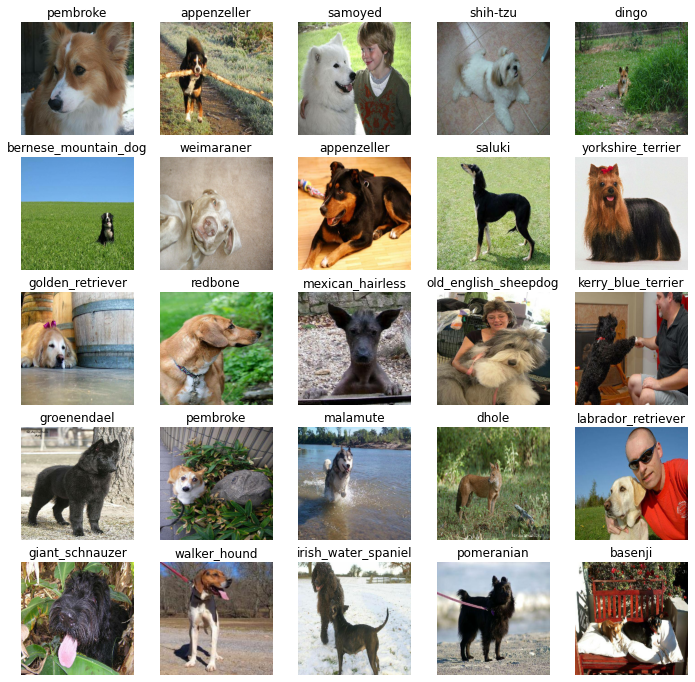

In [12]:
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """ Displays 25 images from a data batch. """
  plt.figure(figsize=(12, 12))

  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.axis("off")
    # Add the image label as the title
    plt.title(unique_labels[labels[i].argmax()])
    
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
print(train_images[0])
print(train_labels[0])
show_25_images(train_images, train_labels)

# **Creating a model**

We'll use an existing model from [TensorFlow Hub](https://tfhub.dev/).
TensorFlow Hub is a resource where you can find pretrained machine learning models for the problem you're working on. Using a pretrained machine learning model is referred to as **transfer learning**.


We know our problem is image classification, we can navigate the [TensorFlow Hub page by our problem domain (image)](https://tfhub.dev/s?module-type=image-augmentation,image-classification,image-feature-vector,image-generator,image-object-detection,image-others,image-style-transfer,image-rnn-agent).  We start by choosing the image problem domain, and then can filter it down by subdomains, in our case, [image classification](https://tfhub.dev/s?module-type=image-classification).

Clicking on the [mobilenet_v2_130_224](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4) model, tells us this model takes an input of images in the shape 224, 224. It also says the model has been trained in the domain of image classification.

Things we need to define: The input shape, The output shape, and The URL of the model we want to use.


In [13]:
# Setup input shape to the model = batch, height, width, colour channels
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] 

# Setup output shape of the model = number of unique labels
OUTPUT_SHAPE = len(unique_labels) 

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [14]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # We define the model layers
  model = tf.keras.Sequential([
    # Layer 1 (input layer)
    hub.KerasLayer(MODEL_URL),
    # Layer 2 (output layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,   activation="softmax") 
  ])

  # Compile the model, we define how the model is going to learn
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

## **Compiling and Building the model**


Transferring this to `model.compile()` terminology:
* `loss` - The models goal is to minimize this, getting to 0 means the model is learning perfectly.
* `optimizer` - Your friend Adam is the optimizer, he's the one telling you how to navigate. His name is Adam because the [Adam optimizer](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/) is a great general which performs well on most models. Other optimizers include [RMSprop](https://ruder.io/optimizing-gradient-descent/index.html#rmsprop) and [Stochastic Gradient Descent](https://en.wikipedia.org/wiki/Stochastic_gradient_descent).
* `metrics` -In our case, we try to maximise the accuracy of our model.

We use `model.build()` whenever we're using a layer from TensorFlow Hub to tell our model what input shape it can expect.

In this case, the input shape is `[None, IMG_SIZE, IMG_SIZE, 3]` or `[None, 224, 224, 3]` or `[batch_size, img_height, img_width, color_channels]`.
Batch size is left as `None` as this is inferred from the data we pass the model. In our case, it'll be 32 since that's what we've set up our data batches as.

We can call `summary()` on our model to get idea of what our model looks like.


In [ ]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


The non-trainable parameters are the patterns learned by `mobilenet_v2_130_224` and the trainable parameters are the ones in the dense layer we added.
This means the main bulk of the information in our model has already been learned and we're going to take that and adapt it to our own problem.

## **Creating callbacks**

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.
The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.



### **TensorBoard Callback**
[TensorBoard](https://www.tensorflow.org/tensorboard/get_started) helps provide a visual way to monitor the progress of your model during and after training.
It can be used [directly in a notebook](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to :
1. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
2. Visualize the our models training logs using the `%tensorboard` magic function (we'll do this later on).

In [41]:
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/My Drive/Colab Notebooks/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### **Early Stopping Callback**

[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

In [42]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

# **Training a model (on a subset of data)**
Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data. We do this to make sure everything is working. And if it is, we can step it up later and train on the entire training dataset.

The final parameter we'll define before training is `NUM_EPOCHS`.
`NUM_EPOCHS` defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

If `NUM_EPOCHS=1`, the model will only look at the data once and will probably score badly because it hasn't a chance to correct itself. What's a good value for `NUM_EPOCHS`?

This one is hard to say. 10 could be a good start but so could 100. This is one of the reasons we created an early stopping callback. Having early stopping setup means if we set `NUM_EPOCHS` to 100 but our model stops improving after 22 epochs, it'll stop training.


Let's create a simple function which trains a model. The function will:
* Create a model using `create_model()`.
* Setup TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training and validatation data, number of epochs,  and the callbacks we'd like to use.

In [15]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 90 #@param {type:"slider", min:10, max:100, step:10}

In [16]:
# Build a function to train and return a trained model
def train_model():
  """ Trains a given model and returns the trained version. """

  # Create a model
  model = create_model()

  # Create new TensorBoard session/logs_directory everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [17]:
# Fit the model to the data
# model = train_model()

## **Model Learning and Overfitting**

Thanks to our `early_stopping` callback, the model stopped training after 11 epochs. This is because the validation accuracy failed to improve for 3 epochs.

But the good new is, we can definitely see our model is learning something with the accuracy going up . This means, if we were to scale up the number of images, hopefully we'd see the validation accuracy increase.

**Question:** It looks like our model might be overfitting (getting far better results on the training set than the validation set), what are some ways to prevent model overfitting? **Note:** Overfitting to begin with is a good thing. It means our model is learning something.



## **Checking the TensorBoard logs**
Now our model has been trained, we can make its performance visual by checking the TensorBoard logs. The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.

In [26]:
# We load TensorBoard to monitor the model whilst it trains (should update every 30-seconds).
%tensorboard --logdir '/content/drive/My Drive/Colab Notebooks/logs/20200912-145019'

<IPython.core.display.Javascript object>

# Making and evaluating predictions using a trained model

Before we scale up and train on more data, let's see some other ways we can evaluate our model. Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action.
Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

## Making predictions
Making predictions on the validation data (200 images) returns an array of arrays, each one containing 120 different values, which are the probabilities of the likelihood for each unique dog breed. The higher the value, the more likely the model thinks a given image is a specific breed of dog.

Let's convert an array of probabilities into an actual label.

In [27]:
predictions  = model.predict(val_data)

In [28]:
index = 0
print("Predictions probabilities array is {}\n".format(predictions[index]))
print("Max probability value : {}\n".format(np.max(predictions[index])))
print("Index of the maximum probability value : {}\n".format(np.argmax(predictions[index])))
print("Sum of the probabilities values : {}\n".format(np.sum(predictions[index])))
print('Predicted labels is : {}\n'.format(unique_labels[np.argmax(predictions[index])]))

Predictions probabilities array is [1.46441802e-04 1.43359421e-05 1.03139901e-05 2.64893188e-05
 1.17463490e-03 7.15166534e-05 1.17223108e-05 8.16741202e-04
 1.06142550e-04 1.54093417e-04 1.45543690e-05 6.33458112e-05
 9.94821676e-06 4.38134384e-06 1.09759989e-04 2.00498630e-06
 7.02157849e-05 2.99685460e-04 7.13704731e-06 2.28848285e-03
 7.49142200e-05 8.56350176e-04 4.33193170e-04 3.66216918e-05
 5.30051148e-06 4.46302089e-04 1.46600403e-04 1.60790834e-04
 1.13004106e-04 5.63898997e-04 3.30020957e-05 4.61945747e-05
 8.55311828e-06 1.23545124e-05 1.91442159e-04 1.54197714e-05
 5.42308953e-06 5.45498506e-06 2.29944068e-04 6.21008940e-06
 6.01179345e-05 1.35949362e-04 2.29973914e-04 6.71192611e-05
 1.23888576e-05 5.05714270e-04 1.27458916e-04 2.39999572e-04
 2.10554237e-04 3.06796828e-05 1.58562250e-06 1.52471548e-04
 3.91555404e-05 1.04962650e-03 1.55750956e-06 2.86314844e-05
 4.97310521e-06 8.04370327e-04 1.31112611e-05 1.04885439e-04
 4.29944182e-03 3.10073337e-05 7.23647754e-05 1.37

In [29]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):  
  """  Turns an array of prediction probabilities into a label. """
  return unique_labels[np.argmax(prediction_probabilities)]

get_pred_label(predictions[96])

'briard'

To compare our results, we want to plot our validation_set images, wtih their predicted labels & their truth labels. The first step is to get our data ready to feed our plot. Since our validation data (`val_data`) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using [`unbatch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch)) and then turn it into an iterator using [`as_numpy_iterator()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator).

In [30]:
def unbatchify(data):
    """ Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.  """
    data_as_list = list(data.unbatch().as_numpy_iterator())
    images = [ ]
    true_labels = [ ]
    for image, label in data_as_list:
      images.append(image)
      true_labels.append(get_pred_label(label))
    return images, true_labels 

images, true_labels = unbatchify(val_data)
true_labels[:1]

['pug']

## Potting predictions
Good. Now we have our Prediction labels; our Validation labels (truth labels) and our Validation images We write a function to be able to view an image, its predicted label and its actual label (true label).


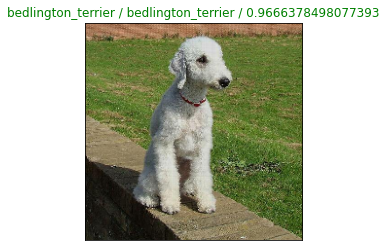

In [34]:
def plot_predicted_truth_labels(image_list, true_labels_list, predictions, index):
    # Get true and preidcted labels, and the probability of prediction
    true_label = true_labels_list[index]
    predicted_label = get_pred_label(predictions[index])
    prediction_probabilty = np.max(predictions[index])
    # plot the image 
    plt.imshow(image_list[index])
    plt.xticks([])
    plt.yticks([])
    color = 'green' if true_label == predicted_label else 'red'
    # title is : true_lable, predicted_label, probability
    plt.title("{} / {} / {}".format(true_label,   
                                    predicted_label, 
                                    prediction_probabilty),
                                    color=color)
  
plot_predicted_truth_labels(images, true_labels, predictions, 7)

Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making.  The function will:
* Take a prediction probabilities array, a ground truth labels array and an integer.
* Find the top 10 Prediction probabilities values, indexes and labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [35]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

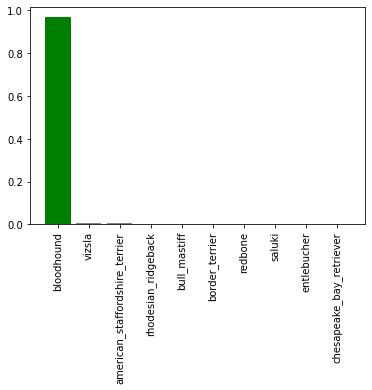

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=true_labels,   n=9)

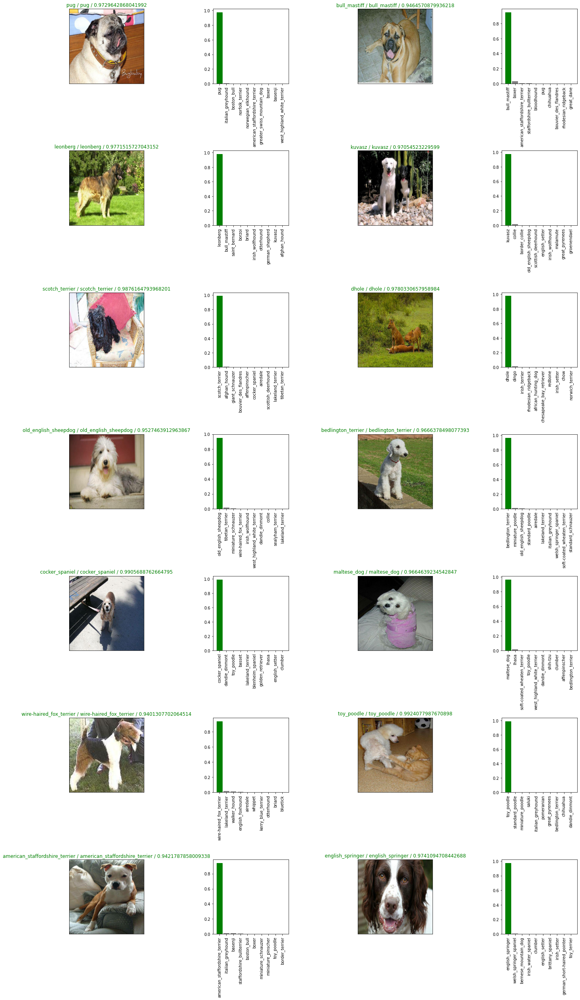

In [36]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 7
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_predicted_truth_labels(images, true_labels, predictions, i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=true_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and reloading a model
After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it. The format of an [entire saved Keras model is h5](https://www.tensorflow.org/tutorials/keras/save_and_load). So we'll make a function which can take a model as input and utilise the [`save()`](https://www.tensorflow.org/tutorials/keras/save_and_load#savedmodel_format) method to save it as a h5 file to a specified directory.

## Save a model

In [19]:
def save_model(model, suffix=None):
  """ Saves a given model in a models directory and appends a suffix (str) """

  # Create model directory with current time
  modeldir = os.path.join("/content/drive/My Drive/Colab Notebooks", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  # Save format of model
  model_path = modeldir + "-" + suffix + ".h5" 
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

## Loading a model
Let's create a function which can take a model path and use the [`tf.keras.models.load_model()`](https://www.tensorflow.org/api_docs/python/tf/keras/models/load_model) function to load it.
Because we're using a component from TensorFlow Hub (`hub.KerasLayer`) we'll have to pass this as a parameter to the `custom_objects` parameter.

In [20]:
def load_model(model_path):
  """ Loads a saved model from a specified path. """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [33]:
# Save our model trained on 1000 images
# save_model(model, suffix="1000-images")

# Load our model trained on 1000 images
model = load_model('/content/drive/My Drive/Colab Notebooks/mobilnetV2-9000-images.h5')

Loading saved model from: /content/drive/My Drive/Colab Notebooks/mobilnetV2-9000-images.h5


In [38]:
# Compare the two models (the original and the loaded) with the `evaluate()` method.
print(model.evaluate(val_data))
#print(model_1000_images.evaluate(val_data))

7/7 [==============================] - 1s 126ms/step - loss: 0.0777 - accuracy: 0.9750
[0.0776732936501503, 0.9750000238418579]


# Training the model on the full dataset
Our training went good on a subset of the data, we can now train it one on the full data.

In [39]:
# Full training data set => 10,000 images and labels.
print(len(X), len(y))
print(X[0], y[0])

10222 10222
/content/drive/My Drive/Colab Notebooks/train/000bec180eb18c7604dcecc8fe0dba07.jpg [False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]


In [43]:
# Turn the full training data in a data batch
full_data = create_data_batches(X, y)

# Instantiate a new model for training on the full dataset
full_model = create_model()

# Create callbacks
full_model_tensorboard = create_tensorboard_callback()  # TensorBoard callback
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",  # Early stopping callback
                                                             patience=3)

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,  full_model_early_stopping])

Epoch 1/90
320/320 [==============================] - 6342s 20s/step - loss: 1.3358 - accuracy: 0.6700
Epoch 2/90
320/320 [==============================] - 45s 142ms/step - loss: 0.4025 - accuracy: 0.8791
Epoch 3/90
320/320 [==============================] - 44s 137ms/step - loss: 0.2377 - accuracy: 0.9334
Epoch 4/90
320/320 [==============================] - 43s 136ms/step - loss: 0.1553 - accuracy: 0.9628
Epoch 5/90
320/320 [==============================] - 44s 138ms/step - loss: 0.1071 - accuracy: 0.9793
Epoch 6/90
320/320 [==============================] - 44s 137ms/step - loss: 0.0789 - accuracy: 0.9849
Epoch 7/90
320/320 [==============================] - 44s 137ms/step - loss: 0.0580 - accuracy: 0.9916
Epoch 8/90
320/320 [==============================] - 44s 138ms/step - loss: 0.0457 - accuracy: 0.9948
Epoch 9/90
320/320 [==============================] - 47s 146ms/step - loss: 0.0382 - accuracy: 0.9958
Epoch 10/90
320/320 [==============================] - 46s 144ms/step - l

## Saving and loading the full model

Even on a GPU, our full model took a while to train. So it's a good idea to save it. We can do so using our `save_model()` function.

**Challenge:** It may be a good idea to incorporate the `save_model()` function into a `train_model()` function. Or look into setting up a [checkpoint callback](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint).

In [ ]:
# Save model to file
save_model(full_model, suffix="all-images")



Saving model to: /content/drive/My Drive/Colab Notebooks/20200912-11261599909972-all-images-Adam.h5...


'/content/drive/My Drive/Colab Notebooks/20200912-11261599909972-all-images-Adam.h5'

In [44]:
# Load in the full model
loaded_full_model = load_model('/content/drive/My Drive/Colab Notebooks/all-images-Adam.h5')

Loading saved model from: /content/drive/My Drive/Colab Notebooks/all-images-Adam.h5


#  Making predictions on the test dataset

Our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

We use the  `create_data_batches()` function which take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames and convert them into test data batches using `create_data_batches()`
* Make a predictions array by passing the test data batches to the `predict()` function.

In [45]:
# Get test images filenames
test_path = "/content/drive/My Drive/Colab Notebooks/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

print('Number of test images {}'.format(len(test_filenames)))
test_filenames[:3]

Number of test images 10357


['/content/drive/My Drive/Colab Notebooks/test/eb8e9637c329ca7ad7937be0ec94e80d.jpg',
 '/content/drive/My Drive/Colab Notebooks/test/f11d3e75389720c45f2c0001c131ba21.jpg',
 '/content/drive/My Drive/Colab Notebooks/test/f30f7155fd94e7f0d3621d9cc9031e93.jpg']

In [46]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

In [ ]:
# Make predictions on test data batch using the loaded full model
# Warning : 10.000 test images, may take a while !
test_predictions = loaded_full_model.predict(test_data,  verbose=1)

# Save predictions results
with open("/content/drive/My Drive/Colab Notebooks/test_predictions.pkl", 'wb') as f:
    pickle.dump(test_predictions, f)

# Save Predictions in csv file for Kaggle
Looking at the [Kaggle sample submission](https://www.kaggle.com/c/dog-breed-identification/overview/evaluation), it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:
*   Create a pandas DataFrame with an ID column as well as a column for each dog breed.
*   Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the `unique_breeds` list and the `test_predictions` list.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create an empty csv with 121 columns (id column + 120 dogs breed)
df_kaggle = pd.DataFrame(columns=['id']+ list(unique_labels))

# Add id values. Each id is the test image file name.
test_path = "/content/drive/My Drive/Colab Notebooks/test/"
df_kaggle['id'] = [fname for fname in os.listdir(test_path)]


# Add the prediction probabilities to each dog breed column
df_kaggle[list(unique_labels)] = test_predictions

# Save CSV and show it
df_kaggle.to_csv('/content/drive/My Drive/Colab Notebooks/test_data_predictions_results.csv')
df_kaggle.head(5)

# Making predictions on custom images

If we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To do so, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [49]:
# Get custom image filepaths
custom_path = "/content/drive/My Drive/Colab Notebooks/custom_test_set/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'german_shepherd', 'siberian_husky']

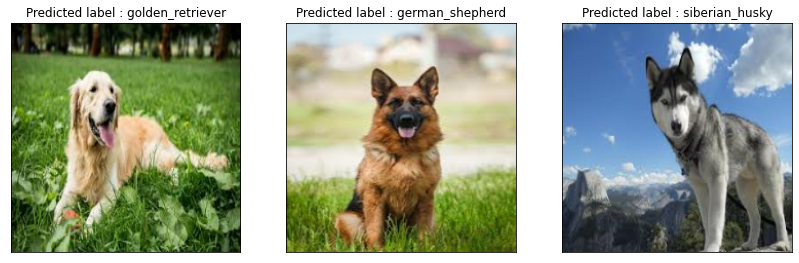

In [51]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

# Check custom image predictions
plt.figure(figsize=(14, 14))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title('Predicted label : '+custom_pred_labels[i])
  plt.imshow(image)